# Excatly 1 Maze
 based on the problem: https://erich-friedman.github.io/puzzle/exactly1/
 
 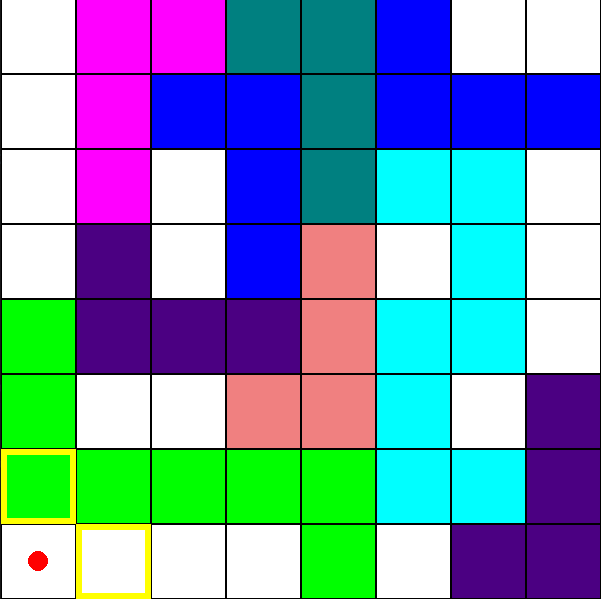
 
 
 importing libraries:

In [12]:
from gym import Env
from gym.spaces import Discrete
from structures import Board
from utils import makeMove, operationConverter, possibleOperations
from screen import Screen

## Imporitng our custom gym enviroment

In [1]:
from ExactlyOneMazesEnv import ExactlyOneMazesEnv
import numpy as np
import random

## Setting up
We set up the env with the custom class


In [2]:
env = ExactlyOneMazesEnv()
state = env.reset()
env.render()

Restarting...


We startup the Q table and the learning parameters

In [3]:
alpha = 0.7         #Learning rate
gamma = 0.618       #Discount rate
epsilon = 1         #Exploration rate
max_epsilon = 1     #Exploration probability at start
min_epsilon = 0.01  #Minimum exploration probability
decay = 0.01        #Exponential decay rate for exploration prob

train_episodes = 2000
test_episodes = 100
max_steps = 100

Q = np.zeros((env.observation_space.n, env.action_space.n))

## Q learning training algorithm:

In [10]:
#Training the agent

training_rewards = []
epsilons = []

for episode in range(train_episodes):
    # Reseting the environment each time as per requirement
    state = env.reset()
    # Starting the tracker for the rewards
    total_training_rewards = 0

    for step in range(100):
        # Choosing an action given the states based on a random number
        exp_exp_tradeoff = random.uniform(0, 1)

        if exp_exp_tradeoff > epsilon:
            action = np.argmax(Q[state.get_obs(), :])
        else:
            action = env.action_space.sample()

        new_state, reward, done, info = env.step(action)

        Q[state.get_obs(), action] = Q[state.get_obs(), action] + alpha * (
                    reward + gamma * np.max(Q[new_state.get_obs(), :]) - Q[state.get_obs(), action])

        total_training_rewards += reward
        state = new_state

        env.render()
        state.print()
        print("Reward: ", reward, "\n")

        if done == True:
            # print ("Total reward for episode {}: {}".format(episode, total_training_rewards))
            break

    # Cutting down on exploration by reducing the epsilon
    epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay * episode)

    # Adding the total reward and reduced epsilon values
    training_rewards.append(total_training_rewards)
    epsilons.append(epsilon)

print("Training score over time: " + str(sum(training_rewards) / train_episodes))

Restarting...
5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
0 4 4 4 8 8  
1 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
1 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
2 1 4 4 8 8  
2 0 0 4 0 0  
Reward:  1 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
2 1 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
2 1 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
2 1 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 1 3 6 6 8  
2 2 4 4 8 8  
2 0 0 4 0 0  
Reward:  1 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 1 3 6 6 8  
2 2 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 1 3 6 6 8  
2 2 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
1 2 3 6 6 8  
2 2 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

5 5 

In [6]:
total_epochs, total_penalties = 0, 0
episodes = 100

state = env.reset()
epochs, penalties, reward = 0, 0, 0

done = False

while not done:
    env.render()
    action = np.argmax(Q[state.get_obs()])
    state, reward, done, info = env.step(action)
    print(action)
    if reward == -10:
        penalties += 1
    epochs += 1
total_penalties += penalties
total_epochs += epochs


print(f"Results after {episodes} episodes:")
print(f"Average timesteps per episode: {total_epochs / episodes}")
print(f"Average penalties per episode: {total_penalties / episodes}")


Restarting...
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


: 

: 

## SARSA
Useful functions

In [4]:
def chose_action(state):
    action=0
    if np.random.uniform(0, 1) < epsilon:
        action = env.action_space.sample()
    else:
        action = np.argmax(Q[state.get_obs(), :])
    return action

#Function to learn the Q-value
def update(state, state2, reward, action, action2):
    predict = Q[state.get_obs(), action]
    target = reward + gamma * Q[state2.get_obs(), action2]
    Q[state.get_obs(), action] = Q[state.get_obs(), action] + alpha * (target - predict)

### SARSA training algorithm:

In [5]:
#Training the agent

#Creating lists to keep track of reward and epsilon values
training_rewards = []
epsilons = []

reward = 0
for episode in range(train_episodes):
    t = 0
    state1 = env.reset()
    action1 = chose_action(state1)

    for step in range(max_steps):
        env.render()

        state2, reward, done, info = env.step(action1)

        action2 = chose_action(state2)

        update(state1, state2, reward, action1, action2)

        state1 = state2
        action1 = action2

        state1.print()
        print("Reward: ", reward, "\n")

        reward += 1

        # Ending the episode
        if done == True:
            # print ("Total reward for episode {}: {}".format(episode, total_training_rewards))
            break

rewardEpisodes = "{:.3f}".format(reward/train_episodes)
print("reward/episodes = ", reward, "/", train_episodes, " = ", rewardEpisodes)

print(Q)

Restarting...
5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
1 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
1 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

5 5 5 7 7 0  
0 3 5 7 6 0  
1 3 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

5 5 5 7 7 0  
0 3 5 7 6 0  
1 3 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
1 3 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
1 3 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
1 3 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
2 1 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  1 

5 5 5 7 7 0  
0 3 5 7 6 0  
2 1 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 5 7 7 0  
0 3 5 7 6 0  
2 1 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  -20 

5 5 